In [27]:
import os
os.environ["PATH"] = "/usr/local/cuda-11.8/bin:{}".format(os.environ["PATH"])
os.environ["LD_LIBRARY_PATH"] = "/usr/local/cuda-11.8/lib64"

import sys
sys.path.append("/data1/yang_liu/python_workspace/GSPL")
os.environ['CUDA_VISIBLE_DEVICES'] = '7'

import random
import torch
import numpy as np
from matplotlib import pyplot as plt
from gsplat.rasterize import rasterize_gaussians
from internal.utils.gaussian_model_loader import GaussianModelLoader
from internal.dataparsers.colmap_dataparser import Colmap, ColmapDataParser

torch.set_grad_enabled(False)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [28]:
device = torch.device("cuda")
ckpt_path = "../outputs/MipNeRF360_vggt_opt_gt_align_vggt_opt_mcmc_x_gamma_epi_gt_align_test/bicycle_vggt_opt_mcmc_x_gamma_epi_gt_align/checkpoints/epoch=200-step=5000.ckpt"
ref_dataset_path = "../data/MipNeRF360/stump"
ckpt = torch.load(ckpt_path, map_location="cpu")
bkgd_color = ckpt["hyper_parameters"]["background_color"]
model = GaussianModelLoader.initialize_model_from_checkpoint(
    ckpt,
    device=device,
)
model.freeze()
model.pre_activate_all_properties()
# initialize renderer
renderer = GaussianModelLoader.initialize_renderer_from_checkpoint(
    ckpt,
    stage="validate",
    device=device,
)
print("Gaussian count: {}".format(model.get_xyz.shape[0]))

Gaussian count: 6543652


Text(0, 0.5, 'Frequency')

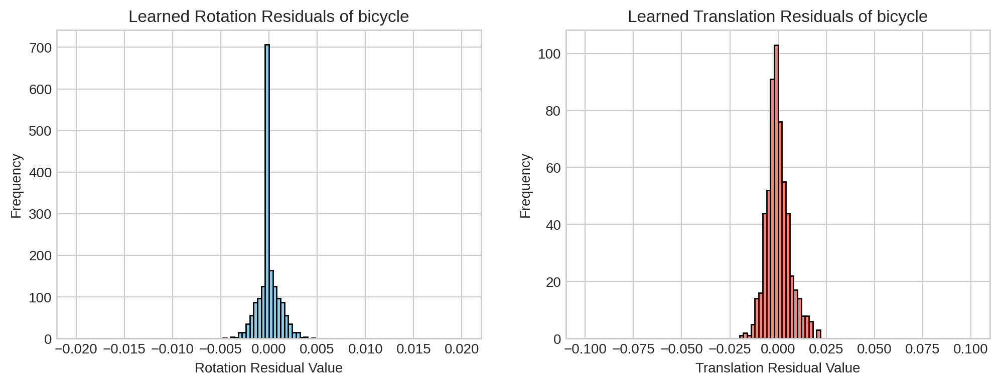

: 

In [29]:
ANALYZE_POSE_RESIDUALS = False

if ANALYZE_POSE_RESIDUALS:
    from internal.renderers.gsplat_camera_opt import rotation_6d_to_matrix

    scene = ckpt["datamodule_hyper_parameters"]["path"].split("/")[-1]
    embeds = renderer.model.embeds(torch.arange(renderer.config.model.n_cameras, device=device))
    dx, drot = embeds[..., :3], embeds[..., 3:]
    rot = rotation_6d_to_matrix(
        drot + renderer.model.identity.expand(dx.shape[0], -1)
    )  # (..., 3, 3)
    transform = torch.eye(4, device=dx.device).repeat((dx.shape[0], 1, 1))
    transform[..., :3, :3] = rot
    transform[..., :3, 3] = dxnv
    diff = (transform - torch.eye(4, device=device).unsqueeze(0)).cpu().numpy()
    plt.style.use("seaborn-v0_8-whitegrid")
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.hist(diff[:, :3, :3].reshape(-1), bins=100, range=(-0.02, 0.02), color='skyblue', edgecolor='black')
    plt.title(f"Learned Rotation Residuals of {scene}")
    plt.xlabel("Rotation Residual Value")
    plt.ylabel("Frequency")

    plt.subplot(1, 2, 2)
    plt.hist(diff[:, :3, 3].reshape(-1), bins=100, range=(-0.1, 0.1), color='salmon', edgecolor='black')
    plt.title(f"Learned Translation Residuals of {scene}")
    plt.xlabel("Translation Residual Value")
    plt.ylabel("Frequency")

In [3]:
# initialize dataset
dataparser_config = ckpt["datamodule_hyper_parameters"]["parser"]
dataset_path = os.path.join("../", ckpt["datamodule_hyper_parameters"]["path"])
dataparser_outputs = dataparser_config.instantiate(
    path=dataset_path,
    output_path=os.getcwd(),
    global_rank=0,
).get_outputs()
dataset = dataparser_outputs.val_set

appearance group by camera id
loading colmap 3D points
down sample enabled
[colmap dataparser] train set images: 109, val set images: 16, loaded mask: 0


In [4]:
ALIGN=False
if ALIGN:
    ref_dataparser_outputs = dataparser_config.instantiate(
        path=ref_dataset_path,
        output_path=os.getcwd(),
        global_rank=0,
    ).get_outputs()

    from tools.metric_torch import evaluate_auc, umeyama

    # correct test view poses
    w2cs = torch.transpose(dataparser_outputs.train_set.cameras.world_to_camera, -2, -1).to(device)
    c2ws = torch.linalg.inv(w2cs)
    c2ws_corrected = renderer.model(c2ws, dataparser_outputs.train_set.cameras.appearance_id.to(device))
    w2cs_corrected = torch.linalg.inv(c2ws_corrected)

    w2cs_ref = torch.transpose(ref_dataparser_outputs.train_set.cameras.world_to_camera, -2, -1).to(device)
    gt_se3 = torch.eye(4, device=device).unsqueeze(0).repeat(len(w2cs_ref), 1, 1)
    gt_se3[:, :3, :3] = torch.tensor(w2cs_ref[:, :3, :3], device=device)
    gt_se3[:, 3, :3] = torch.tensor(w2cs_ref[:, :3, 3], device=device)

    # pred w2c
    pred_se3 = torch.eye(4, device=device).unsqueeze(0).repeat(len(w2cs_corrected), 1, 1)
    pred_se3[:, :3, :3] = torch.tensor(w2cs_corrected[:, :3, :3], device=device)
    pred_se3[:, 3, :3] = torch.tensor(w2cs_corrected[:, :3, 3], device=device)

    auc_results = evaluate_auc(gt_se3, pred_se3, device)

    camera_centers_gt = - (gt_se3[:, :3, :3].cpu().numpy().transpose(0, 2, 1) @ gt_se3[:, 3, :3][..., None].cpu().numpy()).squeeze(-1)
    camera_centers_pred = - (pred_se3[:, :3, :3].cpu().numpy().transpose(0, 2, 1) @ pred_se3[:, 3, :3][..., None].cpu().numpy()).squeeze(-1)
    c, R, t = umeyama(camera_centers_gt.T, camera_centers_pred.T)

    # w2cs_ref_test = torch.transpose(ref_dataparser_outputs.val_set.cameras.world_to_camera, -2, -1).to(device)
    # w2cs_test = torch.transpose(dataparser_outputs.val_set.cameras.world_to_camera, -2, -1).to(device)
    # w2cs_ref_test[:, :3, 3] = w2cs_ref_test[:, :3, 3] * c
    ext_transform = torch.eye(4, device=device)
    ext_transform[:3, :3] = torch.tensor(R, device=device)
    ext_transform[:3, 3:] = torch.tensor(t, device=device)
    ext_transform = torch.linalg.inv(ext_transform)
    # w2cs_ref_test_transformed = w2cs_ref_test @ ext_transform[None]

    # ref_dataparser_outputs.val_set.cameras.world_to_camera = torch.transpose(w2cs_ref_test_transformed, -2, -1)

    dataset = ref_dataparser_outputs.val_set

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1782326].


torch.Size([3, 825, 1245])


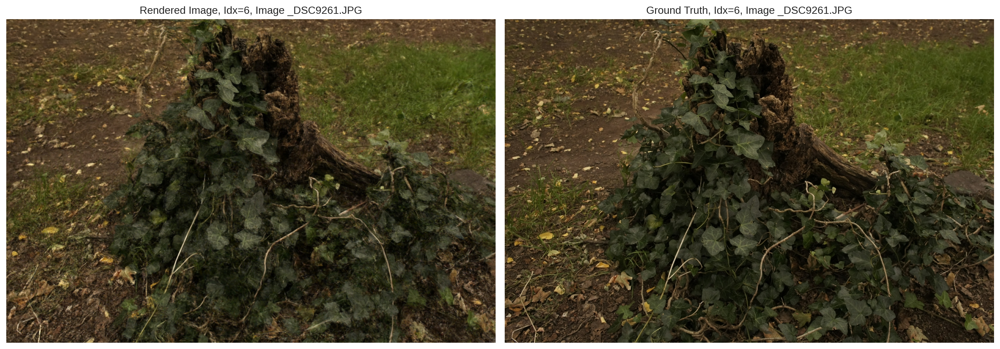

: 

In [8]:
# Test image render
with torch.no_grad():
    idx = random.randint(0, len(dataset) - 1)
    camera = dataset.cameras[idx].to_device("cuda")
    # w2cs = torch.transpose(camera.world_to_camera, -2, -1)
    # w2cs[:3, 3] = w2cs[:3, 3] * c
    # w2cs = w2cs @ ext_transform
    # camera.world_to_camera = torch.transpose(w2cs, -2, -1)
    results = renderer(
        viewpoint_camera=camera,
        pc=model,
        render_types=["rgb", "inverse_depth"],
        bg_color=torch.tensor([0, 0, 0], dtype=torch.float, device="cuda"),
    )
    print(results["render"].shape)

    image_path = dataset.image_paths[idx]
    # depth_path, depth_info = dataparser_outputs.train_set.extra_data[idx]
    gt = torch.tensor(plt.imread(image_path), dtype=torch.float, device="cuda").permute(2, 0, 1)
    gt = (gt / 255.0) if gt.max() > 1 else gt

    # gt_depth = np.load(depth_path) * depth_info["scale"] + depth_info["offset"]
    # predicted_inverse_depth = torch.nn.functional.interpolate(
    #         results["inverse_depth"][None, ...],
    #         size=gt_depth.shape[-2:],
    #         mode="bilinear",
    #         align_corners=False,
    #     )[0, 0].squeeze().cpu().numpy()
    
plt.style.use('seaborn-v0_8-white')
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plt.imshow(results["render"].permute(1, 2, 0).cpu().numpy())
plt.title(f"Rendered Image, Idx={idx}, Image {dataset.image_names[idx]}")
plt.axis('off')
plt.tight_layout()

plt.subplot(1, 2, 2)
plt.imshow(gt.permute(1, 2, 0).cpu().numpy())
plt.title(f"Ground Truth, Idx={idx}, Image {dataset.image_names[idx]}")
plt.axis('off')
plt.tight_layout()

# plt.style.use('seaborn-v0_8-white')
# plt.figure(figsize=(16, 8))
# plt.subplot(1, 2, 1)
# plt.imshow(predicted_inverse_depth, cmap='jet')
# plt.title(f"Rendered Depth, Idx={idx}, Image {dataset.image_names[idx]}")
# plt.axis('off')
# plt.tight_layout()

# plt.subplot(1, 2, 2)
# plt.imshow(gt_depth, cmap='jet')
# plt.title(f"Ground Truth, Idx={idx}, Image {dataset.image_names[idx]}")
# plt.axis('off')
# plt.tight_layout()

(-0.5, 1244.5, 824.5, -0.5)

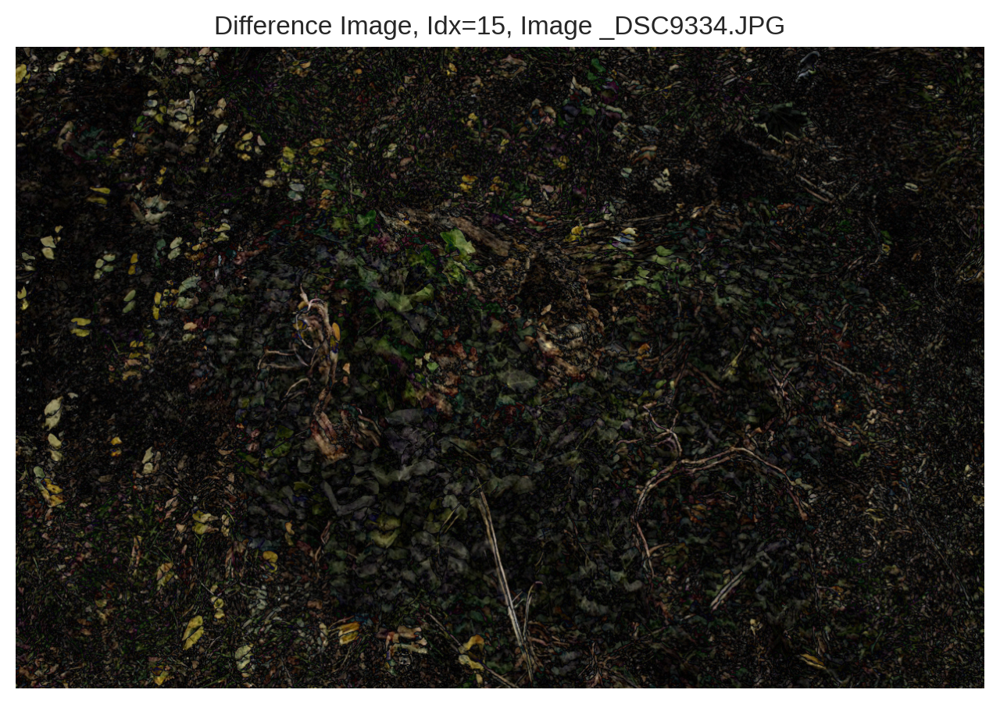

In [62]:
# visualize difference
plt.style.use('seaborn-v0_8-white')
plt.figure(figsize=(8, 8))
plt.imshow(torch.abs(results["render"] - gt).permute(1, 2, 0).cpu().numpy())
plt.title(f"Difference Image, Idx={idx}, Image {dataset.image_names[idx]}")
plt.axis('off')

In [63]:
from torchmetrics import PeakSignalNoiseRatio
psnr = PeakSignalNoiseRatio().to(gt.device)
psnr(results["render"], gt)

/data1/jing_li/anaconda3/envs/gspl_t/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `PeakSignalNoiseRatio` from `torchmetrics` was deprecated and will be removed in 2.0. Import `PeakSignalNoiseRatio` from `torchmetrics.image` instead.
  _future_warning(


tensor(18.4223, device='cuda:0')

: 